### Metadata

1. Opportunity ID: Unique identifier for each sales opportunity.
2. Technology Primary: Main technology or cloud solution offered.
3. Country: Location of the sales opportunity.
4. B2B Sales Medium: Channel or method of the sales process.
5. Sales Velocity: Speed of the sales process from start to finish.(Age)
6. Opportunity Status: Current stage of the sales opportunity.)Target variable)
7. Sales Stage Iterations: Number of stage changes in the sales process.
8. Opportunity Size (USD): Estimated value of the sales opportunity in dollars.
9. Client Revenue Sizing: Category of client's revenue size.
10. Client Employee Sizing: Size of the client's workforce.
11. Business from Client Last Year: Last year's business volume with the client.
12. Compete Intel: Information about competitors and market.
13. Opportunity Sizing: Estimated size or potential of the opportunity.

#### Set-up

In [1]:
#importing all necessary libraries

# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#----regular expressions----
import re

#----model and support imports----
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, ConfusionMatrixDisplay
from imblearn.under_sampling import RandomUnderSampler
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from scipy.stats import uniform, randint
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import (
    cross_validate,
    cross_val_score
)

# Feature Engineering
from category_encoders import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

# Deployment
from flask import Flask, render_template, request
import pickle

# Set the default style for plotting
sns.set(style="whitegrid")

import warnings
warnings.filterwarnings('ignore')

# Set visualisation styles
sns.set(style="whitegrid")

In [2]:
#Loading dataset
df = pd.read_csv('data/saas_pipeline_12K.csv')

# Display the first few rows of the dataset to get an overview
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Opportunity ID                  12000 non-null  object
 1   Technology
Primary              12000 non-null  object
 2   Country                         12000 non-null  object
 3   B2B Sales Medium                12000 non-null  object
 4   Sales Velocity                  12000 non-null  int64 
 5   Opportunity Status              12000 non-null  object
 6   Sales Stage Iterations          12000 non-null  int64 
 7   Opportunity Size (USD)          12000 non-null  int64 
 8   Client Revenue Sizing           12000 non-null  object
 9   Client Employee Sizing          12000 non-null  object
 10  Business from Client Last Year  12000 non-null  object
 11  Compete Intel                   10540 non-null  object
 12  Opportunity Sizing              12000 non-null

In [3]:
df.describe()

,Sales Velocity,Sales Stage Iterations,Opportunity Size (USD)
count,12000.000000,12000.000000,12000.000000
mean,43.485417,2.965333,30034.899250
std,26.733465,1.513987,21737.832618
min,0.000000,1.000000,0.000000
25%,19.000000,2.000000,13000.000000
50%,43.000000,3.000000,29227.500000
75%,65.000000,3.000000,43123.000000
max,210.000000,23.000000,149401.000000


#### Handling Missing Values

In [4]:
missing_values = df.isnull().sum()
print("Remaining Missing Values:\n", missing_values)

Remaining Missing Values:
 Opportunity ID                       0
Technology\nPrimary                  0
Country                              0
B2B Sales Medium                     0
Sales Velocity                       0
Opportunity Status                   0
Sales Stage Iterations               0
Opportunity Size (USD)               0
Client Revenue Sizing                0
Client Employee Sizing               0
Business from Client Last Year       0
Compete Intel                     1460
Opportunity Sizing                   0
dtype: int64


###### Compete Intel Column
For the "Compete Intel  " column, we can use the mode (most frequent value) to fill missing values.

In [5]:
df['Compete Intel'].fillna(df['Compete Intel'].mode()[0], inplace=True)

In [6]:
missing_values = df.isnull().sum()
print("Remaining Missing Values:\n", missing_values)

Remaining Missing Values:
 Opportunity ID                    0
Technology\nPrimary               0
Country                           0
B2B Sales Medium                  0
Sales Velocity                    0
Opportunity Status                0
Sales Stage Iterations            0
Opportunity Size (USD)            0
Client Revenue Sizing             0
Client Employee Sizing            0
Business from Client Last Year    0
Compete Intel                     0
Opportunity Sizing                0
dtype: int64


In [7]:
#We'll drop the "Opportunity ID" 
df.drop(['Opportunity ID', 'Compete Intel'], axis=1, inplace=True)

In [8]:
# Display the distribution of opportunities across different stages
stage_distribution = df['Opportunity Status'].value_counts(normalize=True)
print("Opportunity Distribution:\n", stage_distribution)

Opportunity Distribution:
 Opportunity Status
Lost    0.76975
Won     0.23025
Name: proportion, dtype: float64


#### Duplicate Check

In [9]:
df_dub = df.copy()

# Checking for duplicates and dropping the entire duplicate row if any
df_dub.drop_duplicates(subset=None, inplace=True)
df = df_dub

In [10]:
df.shape

(11877, 11)

#### Data Visualisation

Visualizing the Distribution of Opportunities across Stages:

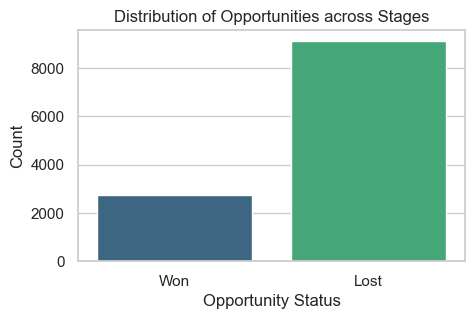

In [11]:
# Distribution of opportunities across different stages
plt.figure(figsize=(5, 3))
sns.countplot(x='Opportunity Status', data=df, palette='viridis')
plt.title('Distribution of Opportunities across Stages')
plt.xlabel('Opportunity Status')
plt.ylabel('Count')
plt.show()

correlation between numerical columns

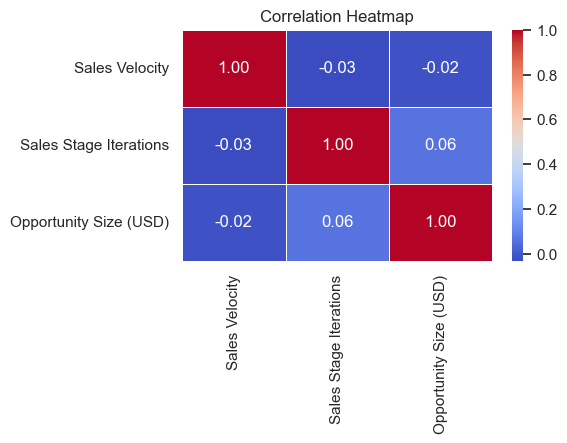

In [12]:
# Select numerical columns for correlation heatmap
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Create a correlation matrix for numerical columns
correlation_matrix = df[numerical_columns].corr()

# Plot the correlation heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

Distribution of Opportunity Size by Opportunity Status:

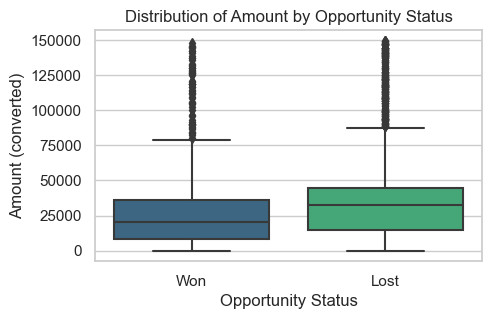

In [13]:
plt.figure(figsize=(5, 3))
sns.boxplot(x='Opportunity Status', y='Opportunity Size (USD)', data=df, palette='viridis')
plt.title('Distribution of Amount by Opportunity Status')
plt.xlabel('Opportunity Status')
plt.ylabel('Amount (converted)')
plt.show()

Technology\nPrimary
ERP Implementation              7581
Technical Business Solutions    4160
Legacy Modernization             100
Analytics                         36
Name: count, dtype: int64


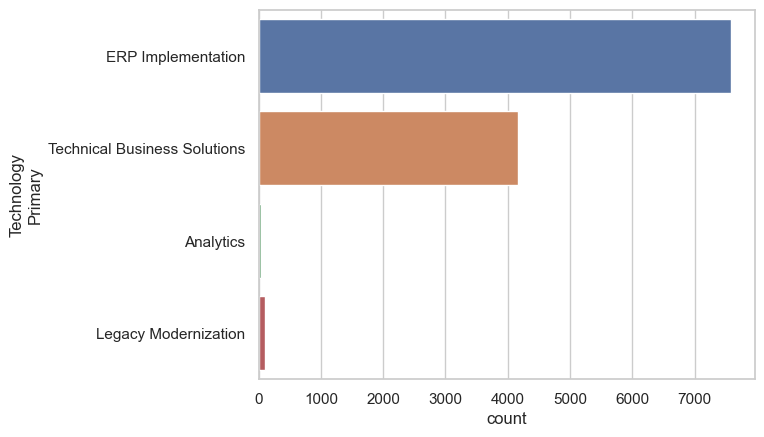

Country
Spain             3225
France            2315
Germany           1502
Sweden            1389
Italy             1257
United Kingdom    1126
Netherlands       1063
Name: count, dtype: int64


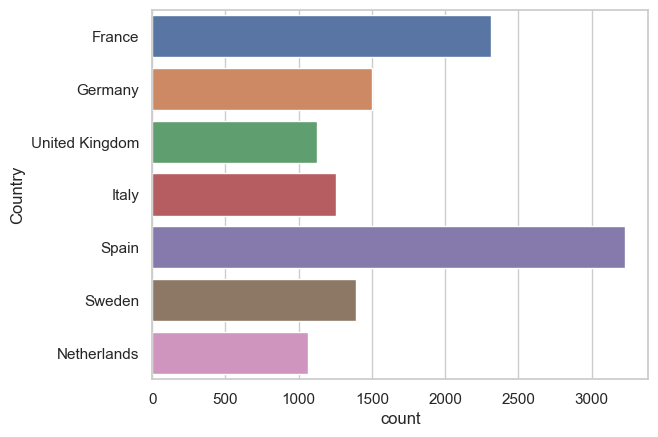

B2B Sales Medium
Marketing             5625
Enterprise Sellers    5350
Partners               447
Tele Sales             350
Online Leads           105
Name: count, dtype: int64


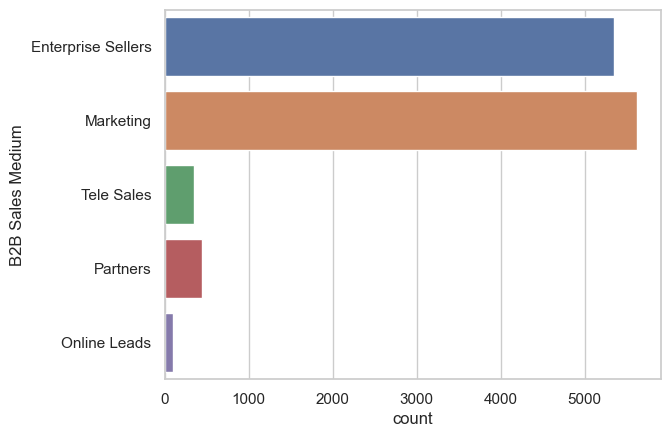

Opportunity Status
Lost    9120
Won     2757
Name: count, dtype: int64


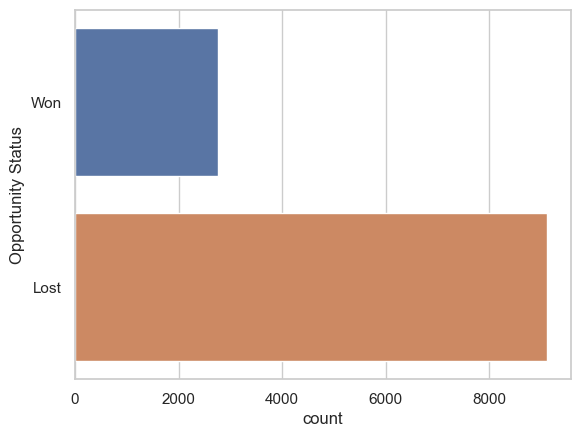

Client Revenue Sizing
100K or less    9107
More than 1M     796
250K to 500K     696
500K to 1M       696
100K to 250K     582
Name: count, dtype: int64


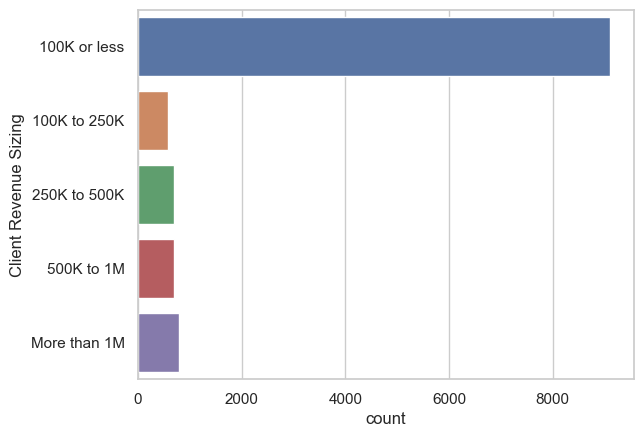

Client Employee Sizing
1K or less       9044
5K to 15K         765
More than 25K     751
1K to 5K          683
15K to 25K        634
Name: count, dtype: int64


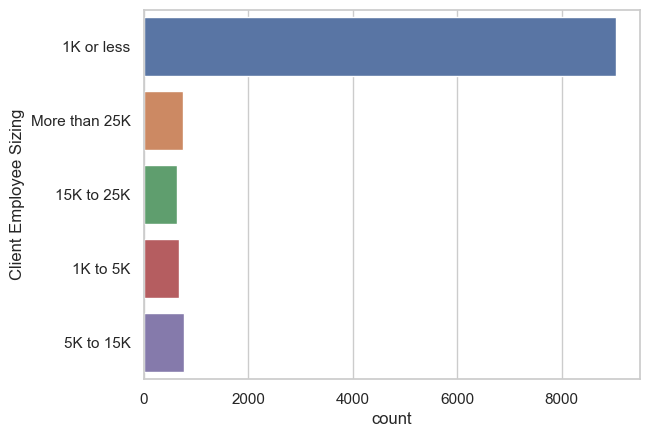

Business from Client Last Year
0 (No business)      10499
More than 100,000      434
25,000 - 50,000        349
50,000 - 100,000       301
0 - 25,000             294
Name: count, dtype: int64


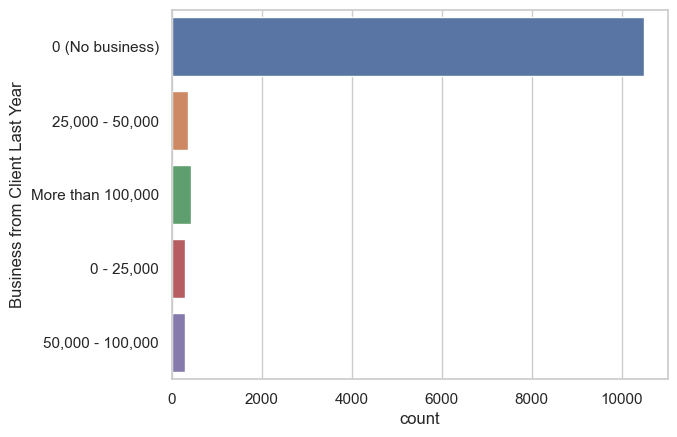

Opportunity Sizing
40K to 50K       2717
10K to 20K       2250
30K to 40K       2044
10K or less      1910
20K to 30K       1835
50K to 60K        737
More than 60K     384
Name: count, dtype: int64


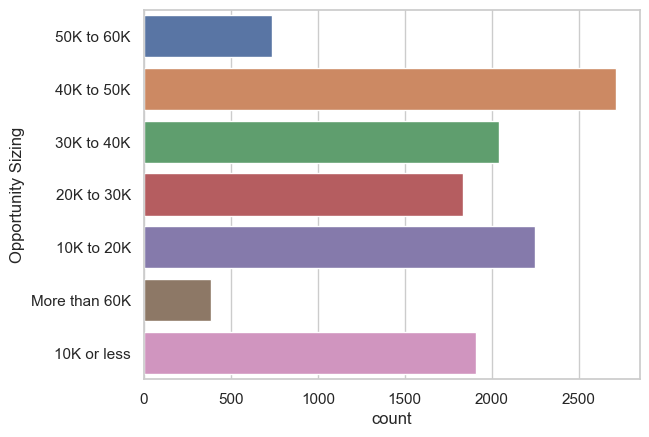

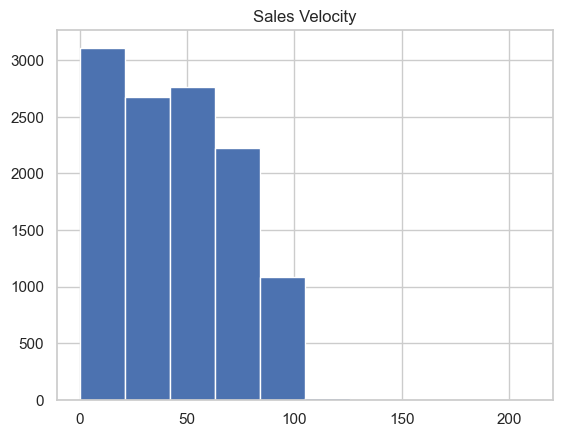

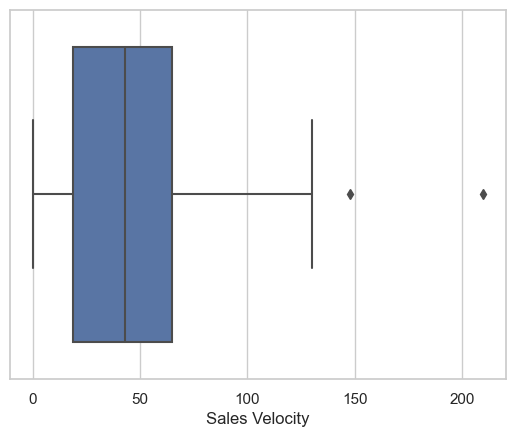

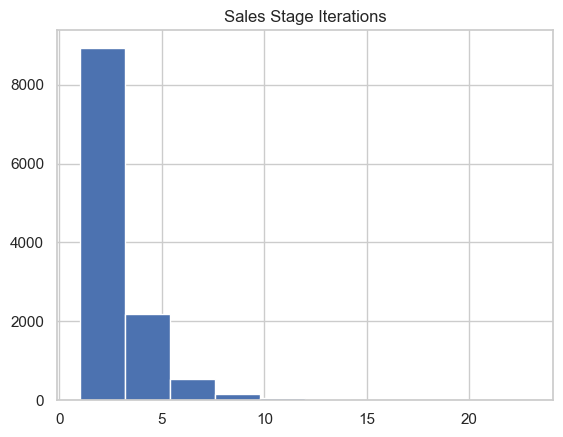

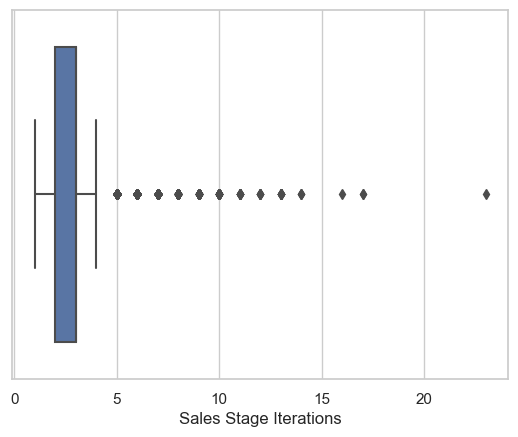

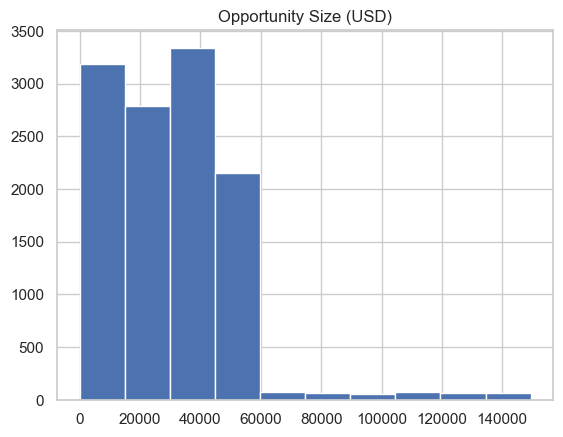

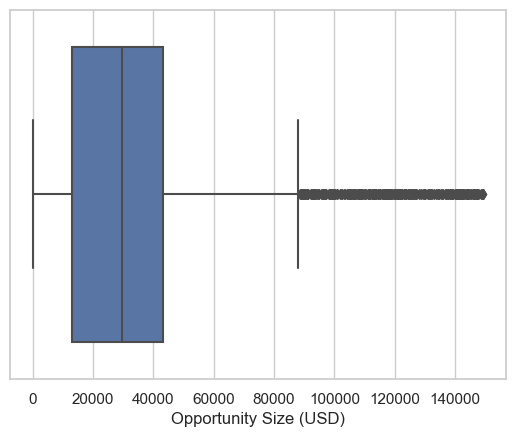

In [14]:
# For categorical variables: value counts and bar plots
for col in df.select_dtypes(include='object').columns:
    print(df[col].value_counts())
    sns.countplot(y=col, data=df)
    plt.show()

# For numeric variables: histograms and box plots
for col in df.select_dtypes(include=np.number).columns:
    df[col].hist()
    plt.title(col)
    plt.show()
    sns.boxplot(x=col, data=df)
    plt.show()

##### Outlier Detection

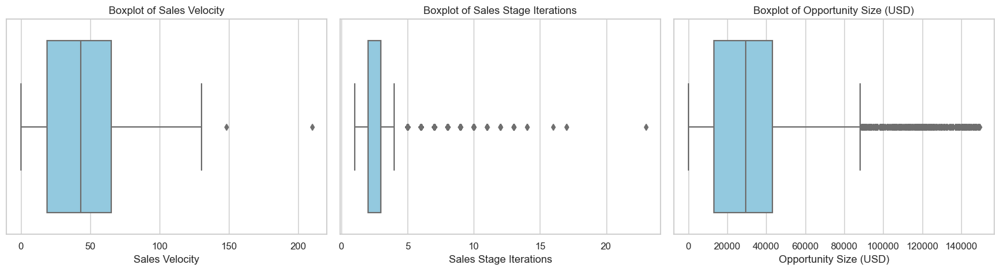

In [15]:
# Select numerical columns for outlier detection
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Create boxplots for numerical columns to visualize outliers
plt.figure(figsize=(16, 8))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df[column], color='skyblue')
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

Lets move to creating a pair plot for numerical features and color the points based on the "Opportunity_Status"

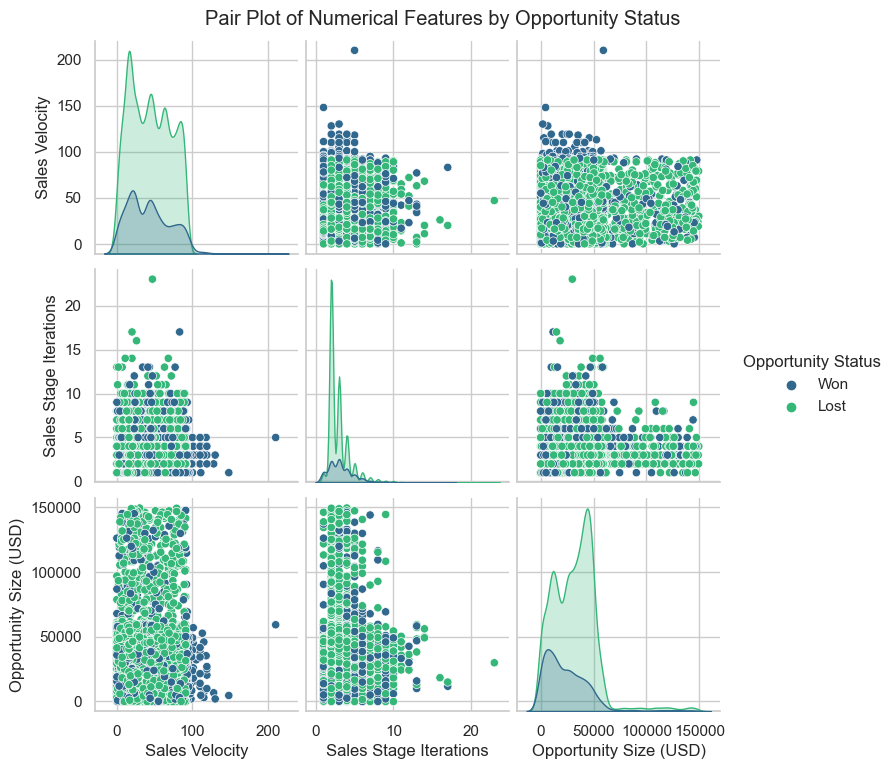

In [16]:
# Select numerical columns for pair plot
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Add the 'Opportunity_Status' column to the selected columns
selected_columns = ['Opportunity Status'] + list(numerical_columns)

# Create a pair plot
pair_plot = sns.pairplot(df[selected_columns], hue='Opportunity Status', palette='viridis')
pair_plot.fig.suptitle('Pair Plot of Numerical Features by Opportunity Status', y=1.02)
plt.show()

Data Distibution

Opportunity Status</br>
Lost    9237</br>
Won     2763

Imbalance in Opportunity Distribution:
The distribution is imbalanced, with "Closed Lost" opportunities being more prevalent. In machine learning models, dealing with imbalanced classes may require special attention during model training to avoid biased results.

Dealing with imbalanced data is an important step, especially when we're working on a classification problem with significantly uneven class distributions. Imbalanced data can lead to biased models, where the algorithm may be more inclined to predict the majority class, and the performance on the minority class could be compromised.

Data Preprocessing and Splitting
Let's define X and y and address the label encoding. We'll use label encoding for the target variable and one-hot encoding for the categorical features.

### Data Manipulation

In [17]:

## Encoders
label_encoder = LabelEncoder()
encoder = OneHotEncoder(sparse=False)


## Converting columns using label encoder
df['Client Employee Sizing'] = label_encoder.fit_transform(df['Client Employee Sizing'])
df['Business from Client Last Year'] = label_encoder.fit_transform(df['Business from Client Last Year'])
df['Opportunity Sizing'] = label_encoder.fit_transform(df['Opportunity Sizing'])
df['Client Revenue Sizing'] = label_encoder.fit_transform(df['Client Revenue Sizing'])

## Converting columns using one hot encoder
df_encode = encoder.fit_transform(df[['Technology\nPrimary', 'Country', 'B2B Sales Medium']])
df_encoded = pd.DataFrame(df_encode, columns=encoder.get_feature_names_out(['Technology\nPrimary', 'Country', 'B2B Sales Medium']))

# Drop the first category to avoid multicollinearity
df_encoded = df_encoded.iloc[:, 1:]

# Reset the index of both DataFrames
df = df.reset_index(drop=True)
df_encoded = df_encoded.reset_index(drop=True)

# Concatenate the original DataFrame and the one-hot encoded DataFrame along columns
df_new = pd.concat([df, df_encoded], axis=1)

df_new

,Technology\nPrimary,Country,B2B Sales Medium,Sales Velocity,Opportunity Status,Sales Stage Iterations,Opportunity Size (USD),Client Revenue Sizing,Client Employee Sizing,Business from Client Last Year,...,Country_Italy,Country_Netherlands,Country_Spain,Country_Sweden,Country_United Kingdom,B2B Sales Medium_Enterprise Sellers,B2B Sales Medium_Marketing,B2B Sales Medium_Online Leads,B2B Sales Medium_Partners,B2B Sales Medium_Tele Sales
0,ERP Implementation,France,Enterprise Sellers,13,Won,6,55289,0,1,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,ERP Implementation,Germany,Marketing,16,Lost,2,47693,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,ERP Implementation,United Kingdom,Marketing,64,Lost,2,34356,0,4,0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,ERP Implementation,France,Enterprise Sellers,9,Won,1,33325,0,1,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,ERP Implementation,Italy,Enterprise Sellers,7,Lost,7,32004,0,1,0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11872,Technical Business Solutions,Sweden,Enterprise Sellers,16,Lost,4,13069,0,1,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
11873,ERP Implementation,Italy,Marketing,45,Lost,4,11287,0,1,0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
11874,ERP Implementation,France,Marketing,21,Lost,4,46434,3,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
11875,ERP Implementation,France,Tele Sales,28,Lost,2,21321,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [18]:
## drop columns 

df_new.drop(['Technology\nPrimary','Country','B2B Sales Medium'], axis=1, inplace=True)

In [19]:
# Creating the target variable, converting into a categorical variable 

y = df_new['Opportunity Status']
X = df_new.drop('Opportunity Status',axis=1)

## Target variable 
y = label_encoder.fit_transform(y)


In [20]:
cor = X.corr()

plt.figure(figsize=(20,10),dpi=1000)
sns.heatmap(
    cor,
    cmap='coolwarm',
    linecolor='white',
    linewidth=2,
    annot=True,
    vmin=-1, 
    vmax=1);

In [21]:
## drop highly correlated columns(usd)
X.drop(['Opportunity Size (USD)', 'Technology\nPrimary_Technical Business Solutions', 'B2B Sales Medium_Marketing'], axis=1, inplace= True)

##### Creating the Split, Train and Test set

In [32]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imb_pipe
import xgboost as xgb

# Split data into training and testing sets with stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)


In [23]:
## Assessing the y_train to observe class distribution
value_counts = np.unique(y_train, return_counts=True)

# Print the result
print("Value counts:", dict(zip(value_counts[0], value_counts[1])))

Value counts: {0: 7296, 1: 2205}


##### Dealing with Imbalance, creating a SMOTE AND RANDOM OVER SAMPLER

In [25]:
## SMOTE
sm = SMOTE()
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

In [26]:
# Apply Random Over-sampling to the training set
ros = RandomOverSampler(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

In [27]:
# Apply Random Under-sampling to the training set
ros = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_train_unsampled, y_train_unsampled = ros.fit_resample(X_train, y_train)

### CREATING THE PREDICTIVE MODELS

##### Baseline model using simple logistic regression

In [64]:
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Applying imbalance method to scaled data
X_train_smote, y_train_smote = sm.fit_resample(X_train_scaled, y_train)


# Initiating Logistic regression and fitting the trains
logreg_model = LogisticRegression(penalty='l2', C=1.0, random_state=42)
logreg_model.fit(X_train_smote, y_train_smote)


# Making prediction on the y_train
logreg_prediction = logreg_model.predict(X_train_smote)
print('-------   Classification  Report Train Set')
print(classification_report(y_train_smote, logreg_prediction))
print(accuracy_score(y_train_smote, logreg_prediction).round(2))

print('     ')

# Making prediction to test performance of the model
logreg_predictions = logreg_model.predict(X_test_scaled)
print('-------   Classification  Report Test Set')
print(classification_report(y_test, logreg_predictions))
print(accuracy_score(y_test, logreg_predictions).round(2))


-------   Classification  Report Train Set
              precision    recall  f1-score   support

           0       0.68      0.68      0.68      7296
           1       0.68      0.67      0.68      7296

    accuracy                           0.68     14592
   macro avg       0.68      0.68      0.68     14592
weighted avg       0.68      0.68      0.68     14592

0.68
     
-------   Classification  Report Test Set
              precision    recall  f1-score   support

           0       0.88      0.70      0.78      1824
           1       0.40      0.68      0.51       552

    accuracy                           0.69      2376
   macro avg       0.64      0.69      0.64      2376
weighted avg       0.77      0.69      0.71      2376

0.69


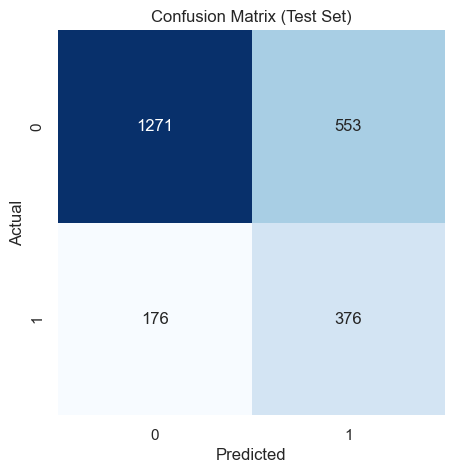

In [111]:
# show confusion matrix

confu = confusion_matrix(y_test, logreg_predictions)

plt.figure(figsize=(5, 5))
sns.heatmap(confu, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### CREATING THE BEST MODEL

##### Applying an XGBoost classifier

In [87]:
# Train XGBoost classifier
model_xgb = xgb.XGBClassifier()
model_xgb.fit(X_train_resampled, y_train_resampled)

# Evaluate the model on the testing set
y_pred = model_xgb.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(accuracy_score(y_test, y_pred).round(2))

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.85      0.88      1824
           1       0.60      0.74      0.66       552

    accuracy                           0.82      2376
   macro avg       0.76      0.80      0.77      2376
weighted avg       0.84      0.82      0.83      2376

0.82


##### Hyperparameter Tuning

In [99]:
# Define the hyperparameter distributions for RandomizedSearchCV
param_dist = {
    'n_estimators': (100, 111),
    'max_depth': (1,5),
    'eta': (0.11,0.12),
    'alpha': (0,1)
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=model_xgb,
                                   param_distributions=param_dist,
                                   n_iter=10, scoring='accuracy',
                                   cv=5, n_jobs=-1, 
                                   random_state=42)


##### Best Model

In [100]:
# Fit the model on the resampled training data
random_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters from the random search
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Access the best model (best_estimator_ contains the trained model with the best hyperparameters)
best_model_xgb = random_search.best_estimator_
best_model_xgb


Best Hyperparameters: {'n_estimators': 111, 'max_depth': 5, 'eta': 0.12, 'alpha': 1}


XGBClassifier(alpha=1, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.12, eval_metric=None,
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=111,
              n_jobs=None, ...)

##### Testing on the train set

In [102]:
# Evaluate the model on the resampled training set

y_pred_train_resampled = best_model_xgb.predict(X_train_resampled)
print("Best Model Training Set Classification Report:")
print(classification_report(y_train_resampled, y_pred_train_resampled))
print("Resampled Training Set Accuracy:", accuracy_score(y_train_resampled, y_pred_train_resampled).round(2))


Best Model Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.83      7296
           1       0.83      0.81      0.82      7296

    accuracy                           0.82     14592
   macro avg       0.82      0.82      0.82     14592
weighted avg       0.82      0.82      0.82     14592

Resampled Training Set Accuracy: 0.82


##### Cross Validation To Test Performance

In [104]:
from sklearn.model_selection import StratifiedKFold, cross_val_score

# Set the number of desired folds
n_splits = 5

# Create a StratifiedKFold object
stratified_kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)


kf_cv = cross_validate(
    estimator = best_model_xgb , # model to evaluate
    X = X_train_resampled,
    y = y_train_resampled,
    cv = stratified_kf,        # number of cross-validation split
    scoring ='accuracy', # evaluation metric
    return_train_score=True
)

kf_cv['validation_score'] = kf_cv.pop('test_score')

kf_cv

{'fit_time': array([0.35353422, 0.20455003, 0.25021315, 0.26883411, 0.34615874]),
 'score_time': array([0.02384019, 0.02255702, 0.01569581, 0.01468682, 0.00964928]),
 'train_score': array([0.82917845, 0.8306348 , 0.82379647, 0.82790817, 0.82945006]),
 'validation_score': array([0.80986639, 0.80918123, 0.80431803, 0.80705963, 0.79780672])}

##### Evaluating on the test set

In [105]:
y_pred = best_model_xgb.predict(X_test)
print("Testing Set Classification Report:")
print(classification_report(y_test, y_pred))
print("Testing Set Accuracy:", accuracy_score(y_test, y_pred).round(2))

Testing Set Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.82      0.87      1824
           1       0.57      0.80      0.67       552

    accuracy                           0.82      2376
   macro avg       0.75      0.81      0.77      2376
weighted avg       0.85      0.82      0.82      2376

Testing Set Accuracy: 0.82


##### Building the confusion matrix

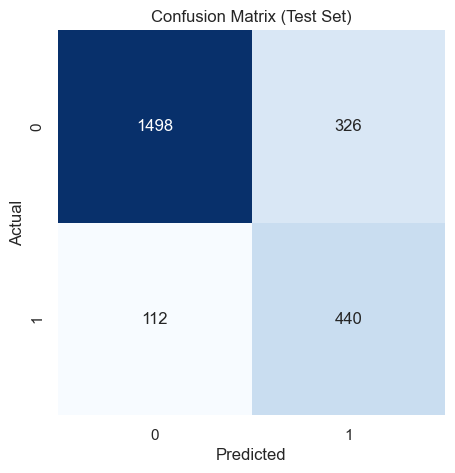

In [112]:
# show confusion matrix

confusion = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Comparing Baseline Model VS Best Model

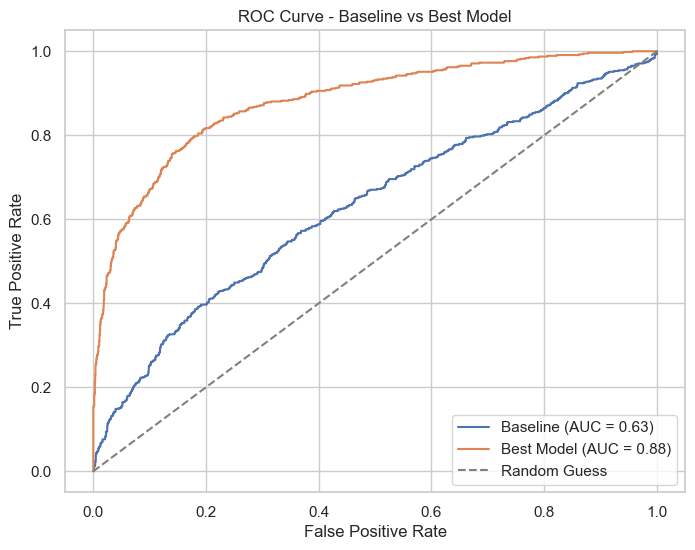

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class (class 1)
y_prob_baseline = logreg_model.predict_proba(X_test)[:, 1]
y_prob_best = best_model_xgb.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr_baseline, tpr_baseline, _ = roc_curve(y_test, y_prob_baseline)
fpr_best, tpr_best, _ = roc_curve(y_test, y_prob_best)

# Calculate AUC (Area Under the Curve)
auc_baseline = auc(fpr_baseline, tpr_baseline)
auc_best = auc(fpr_best, tpr_best)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_baseline, tpr_baseline, label=f'Baseline (AUC = {auc_baseline:.2f})')
plt.plot(fpr_best, tpr_best, label=f'Best Model (AUC = {auc_best:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Baseline vs Best Model')
plt.legend()
plt.show()